In [2]:
import cv2 as cv
import numpy as np
import sys

import matplotlib.pyplot as plt

In [3]:
src_video_file_path = '/mnt/data/small_video_clips/raws_Breaking_Bad_s01e01/raws_Breaking_Bad_s01e01-9.mkv'
out_video_file_path = '/mnt/data/small_video_clips/out_sparce.avi'

In [4]:
def draw_str(dst, target, s):
    x, y = target
    cv.putText(dst, s, (x+1, y+1), cv.FONT_HERSHEY_PLAIN, 1.0, (0, 0, 0), thickness = 2, lineType=cv.LINE_AA)
    cv.putText(dst, s, (x, y), cv.FONT_HERSHEY_PLAIN, 1.0, (255, 255, 255), lineType=cv.LINE_AA)

In [6]:
cap = cv.VideoCapture(src_video_file_path)

if not cap.isOpened(): 
    print ("could not open file")
    sys.exit() 

length = int(cap.get(cv.CAP_PROP_FRAME_COUNT))
width  = int(cap.get(cv.CAP_PROP_FRAME_WIDTH))
height = int(cap.get(cv.CAP_PROP_FRAME_HEIGHT))
fps    = cap.get(cv.CAP_PROP_FPS)

print(length, width, height, fps)

120 1280 720 23.976023976023978


In [7]:
feature_params = dict(maxCorners = 500, qualityLevel=0.3, minDistance=7, blockSize=7)

lk_params = dict(winSize=(15, 15), maxLevel =2, criteria=(cv.TERM_CRITERIA_EPS | cv.TERM_CRITERIA_COUNT, 10, 0.03))

In [8]:
class App:
    def __init__(self, video_src):
        self.track_len = 10
        self.detect_interval = 5
        self.tracks = []
        self.cam = cv.VideoCapture(video_src)
        self.writer = cv.VideoWriter(out_video_file_path, cv.VideoWriter_fourcc('M','J','P','G'), 10, (1280,720))
        self.frame_idx = 0
    
    def display(self, frame):
        plt.imshow(frame)
        plt.axis('off')
        plt.show()
        
    def run(self):
        while True:
            _ret, frame = self.cam.read()
            if _ret == False:
                break
            frame_gray = cv.cvtColor(frame, cv.COLOR_BGR2GRAY)
            vis = frame.copy()
            
            if len(self.tracks) > 0:
                img0, img1 = self.prev_gray, frame_gray
                p0 = np.float32([tr[-1] for tr in self.tracks]).reshape(-1, 1, 2)
                p1, _st, _err = cv.calcOpticalFlowPyrLK(img0, img1, p0, None, **lk_params)
                p0r, _st, _err = cv.calcOpticalFlowPyrLK(img1, img0, p1, None, **lk_params)
                d = abs(p0-p0r).reshape(-1, 2).max(-1)
                good = d < 1
                new_tracks = []
                for tr, (x, y), good_flag in zip(self.tracks, p1.reshape(-1, 2), good):
                    if not good_flag:
                        continue
                    tr.append((x, y))
                    if len(tr) > self.track_len:
                        del tr[0]
                    new_tracks.append(tr)
                    cv.circle(vis, (x, y), 5, (0, 255, 0), -1)
                self.tracks = new_tracks
                cv.polylines(vis, [np.int32(tr) for tr in self.tracks], False, (0, 255, 0))
                draw_str(vis, (20, 20), 'track count:%d'%len(self.tracks))
                
            if self.frame_idx % self.detect_interval == 0:
                mask = np.zeros_like(frame_gray)
                mask[:]=255
                for x, y in [np.int32(tr[-1]) for tr in self.tracks]:
                    cv.circle(mask, (x, y), 5, 0, -1)
                p = cv.goodFeaturesToTrack(frame_gray, mask=mask, **feature_params)
                
                if p is not None:
                    for x, y in np.float32(p).reshape(-1, 2):
                        self.tracks.append([(x, y)])
                        
            self.frame_idx += 1
            self.prev_gray = frame_gray
            
            #write frames in video file
            self.writer.write(vis)
            
            #display individual frames
            self.display(vis)

In [11]:
def main():
    import sys
    try:
        video_src = src_video_file_path
    except:
        video_src = 0

    App(video_src).run()
    print('Done')

Automatically created module for IPython interactive environment


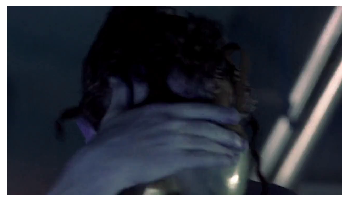

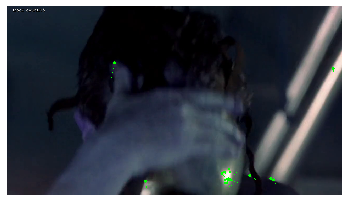

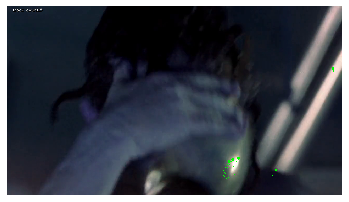

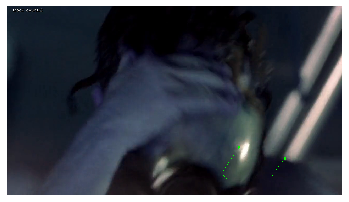

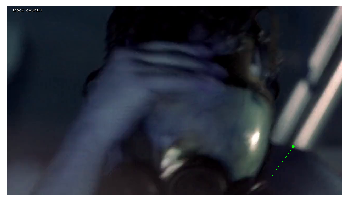

...

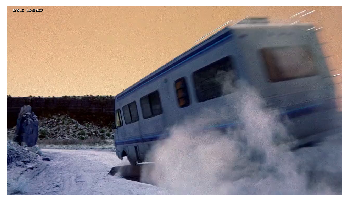

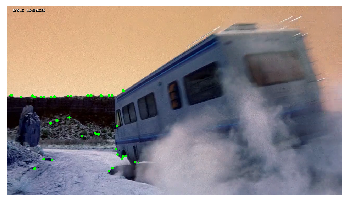

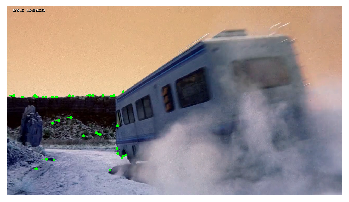

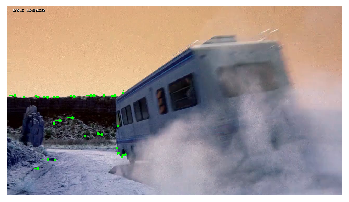

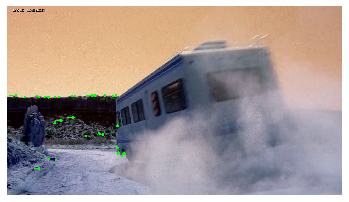

Done


In [12]:
if __name__ == '__main__':
    print(__doc__)
    main()
    cv.destroyAllWindows()